## До-обучение модели Stable Diffusion XL

В этом примере мы до-обучаем [Stable Diffusion XL (SDXL)](https://huggingface.co/docs/diffusers/main/en/api/pipelines/stable_diffusion/stable_diffusion_xl) по технологии [DreamBooth](https://huggingface.co/docs/diffusers/main/en/training/dreambooth) и [LoRA](https://huggingface.co/docs/diffusers/main/en/training/lora).

## Начальная настройка

Для начала, установим необходимые библиотеки.

In [2]:
!pip install bitsandbytes transformers accelerate peft datasets shwarsutils

  Using cached bitsandbytes-0.48.1-py3-none-manylinux_2_24_x86_64.whl.metadata (10 kB)
  Preparing metadata (setup.py) ... done
Using cached bitsandbytes-0.48.1-py3-none-manylinux_2_24_x86_64.whl (60.1 MB)
  Created wheel for shwarsutils: filename=shwarsutils-0.0.1-py3-none-any.whl size=3621 sha256=d13305f5e53ab7e07008f743219567d000e9fd8fb600c2f780a76e1b7200304e
  Stored in directory: /root/.cache/pip/wheels/25/23/bc/4ed414ec2ac4e31a0ce4dfcd15bd7381a309e9b72b936cc61b
Successfully built shwarsutils


Также установим определённую версию библиотеки `diffusers`:

In [3]:
%pip install git+https://github.com/huggingface/diffusers.git@b88fef47851059ce32f161d17f00cd16d94af96a

  Cloning https://github.com/huggingface/diffusers.git (to revision b88fef47851059ce32f161d17f00cd16d94af96a) to /tmp/pip-req-build-yd3w41o7
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/diffusers.git /tmp/pip-req-build-yd3w41o7
  Running command git rev-parse -q --verify 'sha^b88fef47851059ce32f161d17f00cd16d94af96a'
  Running command git fetch -q https://github.com/huggingface/diffusers.git b88fef47851059ce32f161d17f00cd16d94af96a
  Running command git checkout -q b88fef47851059ce32f161d17f00cd16d94af96a
  Resolved https://github.com/huggingface/diffusers.git to commit b88fef47851059ce32f161d17f00cd16d94af96a
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for diffusers: filename=diffusers-0.33.0.dev0-py3-none-any.whl size=3481996 sha256=609c6eca8d51494967b17975594ab66501a599c3da4af1385b7321dddd89dbac
  Stored in directory: /root/.cache/pip/wh

Скачаем файл тренировочного скрипта:

In [4]:
!wget https://raw.githubusercontent.com/yandex-datasphere/ai_art_intensive/refs/heads/main/Day-2/train_dreambooth_lora_sdxl.py

--2025-10-08 11:03:49--  https://raw.githubusercontent.com/yandex-datasphere/ai_art_intensive/refs/heads/main/Day-2/train_dreambooth_lora_sdxl.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 85464 (83K) [text/plain]
Saving to: ‘train_dreambooth_lora_sdxl.py’

train_dreambooth_lo 100%[===================>]  83.46K  --.-KB/s    in 0.001s  

2025-10-08 11:03:49 (113 MB/s) - ‘train_dreambooth_lora_sdxl.py’ saved [85464/85464]



**ВНИМАНИЕ**: После всех установок библиотек рекомендуется перезапустить Kernel ноутбука (выбрать в меню Kernel -> Restart Kernel)

### Датасет

Датасет в виде набора исходных изображений нужно куда-то поместить:
* Загрузить в текущую директорую Datasphere
* Загрузить в хранилище S3 и настроить S3-коннектор

В любом случае путь к данным нужно поместить в переменную ниже, и при необходимости скореектировать расширение:

In [6]:
data_path = "./images"
images = f"{data_path}/*.jpg"

Посмотрим на картинки:

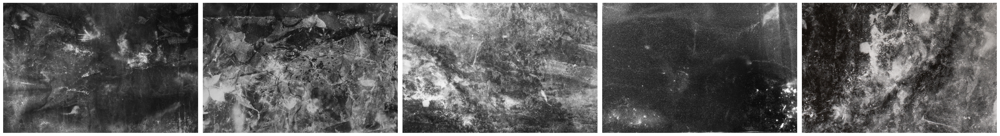

In [7]:
from PIL import Image
from shwars.utils import display_images
import glob

imgs = [Image.open(path) for path in glob.glob(images)]

display_images(imgs[:5])

### Сгенерируем промпты с помощью BLIP

Для обучения модели нам полезно использовать для каждой картинки промпт, который отражает её содержание. Для автоматического получения таких промптов используем нейросеть BLIP:

In [ ]:
import requests
from transformers import AutoProcessor, BlipForConditionalGeneration
import torch
import warnings
warnings.filterwarnings("ignore")

device = "cuda" if torch.cuda.is_available() else "cpu"

# load the processor and the captioning model
blip_processor = AutoProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
blip_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base",torch_dtype=torch.float16).to(device)

# captioning utility
def caption_images(input_image):
    inputs = blip_processor(images=input_image, return_tensors="pt").to(device, torch.float16)
    pixel_values = inputs.pixel_values

    generated_ids = blip_model.generate(pixel_values=pixel_values, max_length=50)
    generated_caption = blip_processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_caption

preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

`torch_dtype` is deprecated! Use `dtype` instead!


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

**ВАЖНО!**

Теперь нужно определиться с идентификатором TOK нашего стиля или объекта:
- Для стилей используйте "In the style of TOK"
- Для людей - "photo of a TOK person"
- Можно использовать дополнительные слова, которые подталкивают модель к нужным смысла, например вместо "a photo of TOK" можно использовать "a photo of TOK dog" / "a photo of TOK corgi dog"

Можете использовать префикс или суффикс в зависимости от особенностей запроса.

In [ ]:
import json

caption_prefix = ""
caption_suffix = ", drawing in SHCGRO style"

imgs_and_paths = [(path,Image.open(path)) for path in glob.glob(images)]

with open(f'{data_path}/metadata.jsonl', 'w') as outfile:
  for img in imgs_and_paths:
      caption = caption_prefix + caption_images(img[1]).split("\n")[0] + caption_suffix
      entry = {"file_name":img[0].split("/")[-1], "prompt": caption}
      json.dump(entry, outfile)
      outfile.write('\n')

В итоге все сгенерированные промпты записались в файл `metadata.jsonl` в директории с данными.

In [ ]:
with open(f'{data_path}/metadata.jsonl') as f:
    print(f.read())

{"file_name": "bacfd6591376b2c9ebbe5a2b6006a446.jpg", "prompt": "a woman with a red eye and a black hair, drawing in SHCGRO style"}
{"file_name": "b788d26be9b19d46441849dd1d1e99fa.jpg", "prompt": "a robot with a small robot on his back, drawing in SHCGRO style"}
{"file_name": "757a3bdf474a67e268ccb694c9b1ad02.jpg", "prompt": "a poster for the upcoming album, ' the art of war ', drawing in SHCGRO style"}
{"file_name": "24ab8aa01a26e6c40ec1e0b6e4872a39.jpg", "prompt": "a woman with a robot head and a machine, drawing in SHCGRO style"}
{"file_name": "844333f9ba2d738435e8cf8cdeffbff3.jpg", "prompt": "a girl with headphones and a microphone, drawing in SHCGRO style"}
{"file_name": "cf9ce798d8c6adb176332010a217c156.jpg", "prompt": "a poster with a panda bear wearing a helmet, drawing in SHCGRO style"}
{"file_name": "c3fbb3f39698b075027d41e8467696d9.jpg", "prompt": "a woman with long hair and a white shirt, drawing in SHCGRO style"}
{"file_name": "756-mix04_shichigoro.jpg", "prompt": "a very 

Освободим память GPU от использованных моделей:

In [ ]:
import gc

del blip_processor, blip_model
gc.collect()
torch.cuda.empty_cache()

## Обучение!

> Если вы хотите обучать модель с одним промптом с использованием `instance_prompt`, то
укажите параметр `instance_data_dir` вместо `dataset_name`

Важные параметры:
 - `output_dir` показывает директорию (и имя репозитория) для обученной LoRA-модели
 - `caption_column` указывает название поля с промптом в нашем датасете. Если вы сгенерировали промпты с помощью кода выше, то используем "prompt"

Чтобы использовать поменьше памяти GPU и ускорить обучение, используем следующие приёмы:
* Gradient checkpointing (--gradient_accumulation_steps)
* 8-bit Adam (--use_8bit_adam)
* Mixed-precision training (--mixed-precision="fp16")

In [ ]:
model_name = "./SHCGRO_LoRA"
instance_prompt = "drawing in SHCGRO style"

In [ ]:
from train_dreambooth_lora_sdxl import main

class dotdict(dict):
    __getattr__ = dict.get
    __setattr__ = dict.__setitem__
    __delattr__ = dict.__delitem__

args = dotdict({})

args.pretrained_model_name_or_path="stabilityai/stable-diffusion-xl-base-1.0"
args.pretrained_vae_model_name_or_path="madebyollin/sdxl-vae-fp16-fix"
args.dataset_name=data_path
args.output_dir=model_name
args.caption_column="prompt"
args.mixed_precision="fp16"
args.instance_prompt=instance_prompt
args.resolution_h=512
args.resolution_w=512
args.train_batch_size=2
args.gradient_accumulation_steps=3
args.gradient_checkpointing=True
args.learning_rate=1e-4
args.snr_gamma=5.0
args.lr_scheduler="constant"
args.lr_warmup_steps=0
args.mixed_precision="fp16"
args.use_8bit_adam=True
args.max_train_steps=200
args.checkpointing_steps=100
args.seed=0
args.logging_dir="logs"
args.revision="main"
args.rank=4
args.use_dora=False
args.optimizer="AdamW"
args.adam_beta1=0.9
args.adam_beta2=0.999
args.adam_epsilon=1e-08
args.adam_weight_decay=1e-04
args.repeats=1
args.num_validation_images=4
args.validation_epochs=50
args.center_crop=False
args.text_encoder_lr=5e-6
args.max_grad_norm=1.0
args.dataloader_num_workers=0

main(args)

10/01/2025 00:06:27 - INFO - train_dreambooth_lora_sdxl - Distributed environment: NO
Num processes: 1
Process index: 0
Local process index: 0
Device: cuda

Mixed precision type: fp16

You are using a model of type clip_text_model to instantiate a model of type . This is not supported for all configurations of models and can yield errors.
You are using a model of type clip_text_model to instantiate a model of type . This is not supported for all configurations of models and can yield errors.
{'rescale_betas_zero_snr', 'variance_type', 'thresholding', 'clip_sample_range', 'dynamic_thresholding_ratio'} was not found in config. Values will be initialized to default values.
Instantiating AutoencoderKL model under default dtype torch.float32.
{'use_quant_conv', 'use_post_quant_conv', 'latents_std', 'latents_mean', 'shift_factor', 'mid_block_add_attention'} was not found in config. Values will be initialized to default values.
All model checkpoint weights were used when initializing Autoenco

Натренированные файлы LoRA-модели находятся в директории `model_name`. Там находятся с одной стороны финальный результат обучения, а также промежуточные *чекпоинты*.

In [ ]:
import glob

glob.glob(model_name+"/*")

['./SHCGRO_LoRA/checkpoint-100',
 './SHCGRO_LoRA/checkpoint-200',
 './SHCGRO_LoRA/pytorch_lora_weights.safetensors']

## Применяем модель

Попробуем сгенерировать изображения с помощью нашей модели.

> На всякий случай, чтобы очистить память, в этом месте можно перезапустить Notebook Kernel.

Для начала, загружаем модель:

In [ ]:
import torch
from diffusers import DiffusionPipeline, AutoencoderKL
pipe = None
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    vae=vae,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
)
pipe.load_lora_weights(model_name)
_ = pipe.to("cuda")

Instantiating AutoencoderKL model under default dtype torch.float16.
{'use_quant_conv', 'use_post_quant_conv', 'latents_std', 'latents_mean', 'shift_factor', 'mid_block_add_attention'} was not found in config. Values will be initialized to default values.
All model checkpoint weights were used when initializing AutoencoderKL.

All the weights of AutoencoderKL were initialized from the model checkpoint at madebyollin/sdxl-vae-fp16-fix.
If your task is similar to the task the model of the checkpoint was trained on, you can already use AutoencoderKL for predictions without further training.
Fetching 17 files: 100%|██████████| 17/17 [00:23<00:00,  1.41s/it]
{'image_encoder', 'feature_extractor'} was not found in config. Values will be initialized to default values.
Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]Loaded tokenizer_2 as CLIPTokenizer from `tokenizer_2` subfolder of stabilityai/stable-diffusion-xl-base-1.0.
Loaded text_encoder as CLIPTextModel from `text_e

Теперь собственно приступаем к генерации изображения:

100%|██████████| 25/25 [00:08<00:00,  3.04it/s]


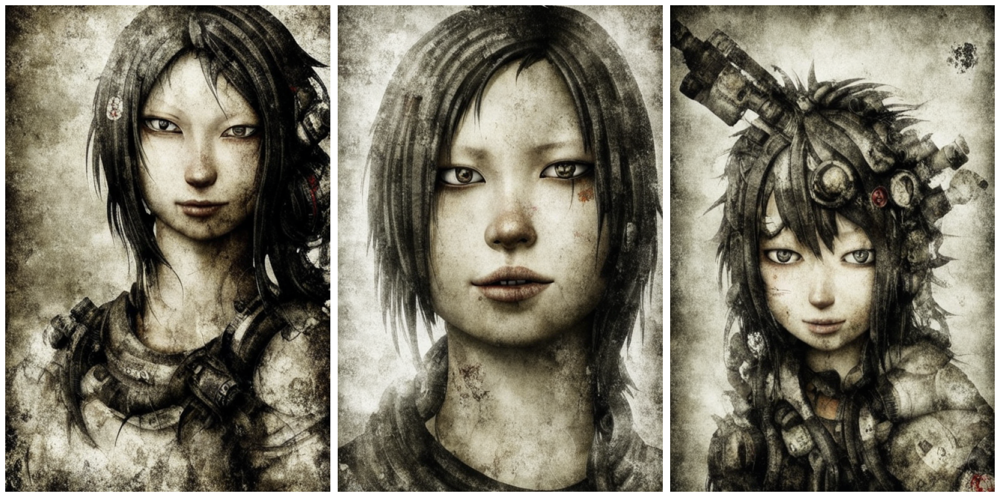

In [ ]:
from shwars.utils import display_images

prompt = "beautiful girl, picture in SHCGRO style"

images = pipe(prompt=prompt, num_inference_steps=25, num_images_per_prompt=3, height=512, width=512).images
display_images(images)

Генерируем серию из изображений:

In [ ]:
import os

prompts = [
    "beautiful girl",
    "ugly old lady",
    "strong man"
]

os.makedirs('output',exist_ok=True)
for x in prompts:
    prompt = f"drawing of {x}, drawing in GRBX style"
    fn = x.replace('/','_').replace('\'','').replace('(','').replace(')','')
    images = pipe(prompt=prompt, num_inference_steps=25, num_images_per_prompt=3,
                  height=512, width=512,verbose=0).images
    for i,im in enumerate(images):
        im.save(f"output/{fn}_{i}.jpg")

100%|██████████| 25/25 [00:07<00:00,  3.53it/s]


Попробуем загрузить промежуточный чекпоинт:

In [ ]:
pipe = None

vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    vae=vae,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
)
pipe.load_lora_weights(model_name+"/checkpoint-100")
_ = pipe.to("cuda")

'(ReadTimeoutError("HTTPSConnectionPool(host='huggingface.co', port=443): Read timed out. (read timeout=10)"), '(Request ID: e66ae02e-9f43-4fb0-82cc-962840ed800c)')' thrown while requesting HEAD https://huggingface.co/madebyollin/sdxl-vae-fp16-fix/resolve/main/config.json
10/01/2025 00:36:05 - WARNING - huggingface_hub.utils._http - '(ReadTimeoutError("HTTPSConnectionPool(host='huggingface.co', port=443): Read timed out. (read timeout=10)"), '(Request ID: e66ae02e-9f43-4fb0-82cc-962840ed800c)')' thrown while requesting HEAD https://huggingface.co/madebyollin/sdxl-vae-fp16-fix/resolve/main/config.json
Retrying in 1s [Retry 1/5].
10/01/2025 00:36:05 - WARNING - huggingface_hub.utils._http - Retrying in 1s [Retry 1/5].
Instantiating AutoencoderKL model under default dtype torch.float16.
{'use_quant_conv', 'use_post_quant_conv', 'latents_std', 'latents_mean', 'shift_factor', 'mid_block_add_attention'} was not found in config. Values will be initialized to default values.
All model checkpoi

100%|██████████| 25/25 [00:07<00:00,  3.47it/s]


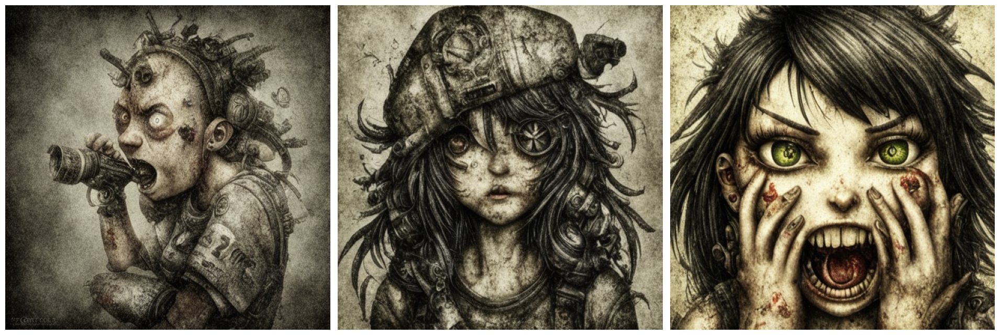

In [ ]:
prompt = "crazy girl, drawing in SHCGRO style"

images = pipe(prompt=prompt, num_inference_steps=25, num_images_per_prompt=3, height=512, width=512).images
display_images(images)

Попробуем применить LoRA-стиль не в полную силу:

In [ ]:
import torch
from diffusers import DiffusionPipeline, AutoencoderKL

pipe = None

vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    vae=vae,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
)
pipe.load_lora_weights(model_name)
pipe.fuse_lora(lora_scale=0.5)
_ = pipe.to("cuda")

Instantiating AutoencoderKL model under default dtype torch.float16.
{'use_quant_conv', 'use_post_quant_conv', 'latents_std', 'latents_mean', 'shift_factor', 'mid_block_add_attention'} was not found in config. Values will be initialized to default values.
All model checkpoint weights were used when initializing AutoencoderKL.

All the weights of AutoencoderKL were initialized from the model checkpoint at madebyollin/sdxl-vae-fp16-fix.
If your task is similar to the task the model of the checkpoint was trained on, you can already use AutoencoderKL for predictions without further training.
{'image_encoder', 'feature_extractor'} was not found in config. Values will be initialized to default values.
Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]Loaded tokenizer_2 as CLIPTokenizer from `tokenizer_2` subfolder of stabilityai/stable-diffusion-xl-base-1.0.
Loaded text_encoder as CLIPTextModel from `text_encoder` subfolder of stabilityai/stable-diffusion-xl-base-1.0.
Load

100%|██████████| 25/25 [00:07<00:00,  3.55it/s]


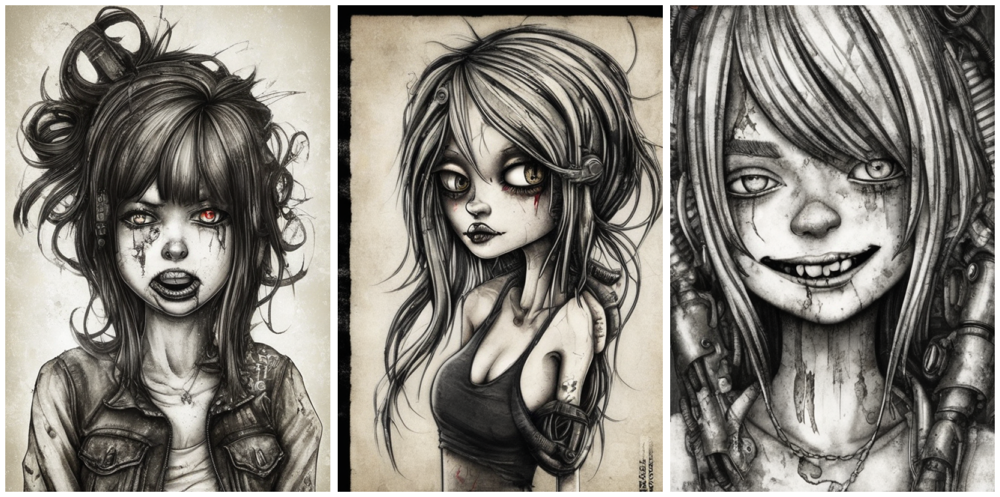

In [ ]:
images = pipe(prompt=prompt, num_inference_steps=25, num_images_per_prompt=3, height=768, width=512).images
display_images(images)

## Сохраняем модель на HuggingFace

Ячейки в этом разделе выполняйте только в том случае, если вы хотите сохранить свою модель в репозитории HuggingFace. Для этого сначала надо войти в HuggingFace, указав **токен** с правами на запись.

In [ ]:
from huggingface_hub import notebook_login
notebook_login()

In [ ]:
from huggingface_hub import whoami
from pathlib import Path

short_model_name = model_name[model_name.find('/')+1:] if '/' in model_name else model_name

username = whoami(token=Path("/root/.cache/huggingface/"))["name"]
repo_id = f"{username}/{short_model_name}"
print(f"Using repo id {repo_id}")

Using repo id shwars/GRBX_LoRA


In [ ]:
from train_dreambooth_lora_sdxl import save_model_card
from huggingface_hub import upload_folder, create_repo

repo_id = create_repo(repo_id, exist_ok=True).repo_id

# change the params below according to your training arguments
save_model_card(
    repo_id = repo_id,
    images=[],
    base_model="stabilityai/stable-diffusion-xl-base-1.0",
    train_text_encoder=False,
    instance_prompt=instance_prompt,
    validation_prompt=None,
    repo_folder=short_model_name,
    use_dora = False,
    vae_path="madebyollin/sdxl-vae-fp16-fix",
)

upload_folder(
    repo_id=repo_id,
    folder_path=model_name,
    commit_message="End of training",
    ignore_patterns=["step_*", "epoch_*"],
)

optimizer.bin:   0%|          | 0.00/15.1M [00:00<?, ?B/s]
Upload 11 LFS files:   0%|          | 0/11 [00:00<?, ?it/s]




scheduler.bin:   0%|          | 0.00/1.00k [00:00<?, ?B/s]



pytorch_lora_weights.safetensors:   0%|          | 0.00/23.4M [00:00<?, ?B/s]


scaler.pt:   0%|          | 0.00/988 [00:00<?, ?B/s]

random_states_0.pkl:   0%|          | 0.00/14.3k [00:00<?, ?B/s]


scaler.pt: 100%|██████████| 988/988 [00:00<00:00, 8.29kB/s]



pytorch_lora_weights.safetensors:   0%|          | 8.19k/23.4M [00:00<05:52, 66.2kB/s]

random_states_0.pkl:  57%|█████▋    | 8.19k/14.3k [00:00<00:00, 70.6kB/s]




optimizer.bin:   1%|          | 188k/15.1M [00:00<00:16, 904kB/s]  



scaler.pt: 100%|██████████| 988/988 [00:00<00:00, 3.63kB/s]4M [00:00<00:16, 1.44MB/s] 
scheduler.bin: 100%|██████████| 1.00k/1.00k [00:00<00:00, 3.34kB/s]
random_states_0.pkl: 100%|██████████| 14.3k/14.3k [00:00<00:00, 41.0kB/s]
optimizer.bin:   8%|▊         | 1.24M/15.1M [00:00<00:03, 4.06MB/s]



pytorch_lora_w

CommitInfo(commit_url='https://huggingface.co/shwars/GRBX_LoRA/commit/628a63f4f386cb6387ef220548b92f368b8a8840', commit_message='End of training', commit_description='', oid='628a63f4f386cb6387ef220548b92f368b8a8840', pr_url=None, repo_url=RepoUrl('https://huggingface.co/shwars/GRBX_LoRA', endpoint='https://huggingface.co', repo_type='model', repo_id='shwars/GRBX_LoRA'), pr_revision=None, pr_num=None)